#### Connaught Place, New Delhi     #####

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox
from descartes import PolygonPatch
from shapely.geometry import LineString
from shapely.geometry import Point
from shapely.geometry import Polygon
import numpy as np
import pandas as pd
%matplotlib inline
import folium
import matplotlib.pyplot as plt
import mplleaflet
from folium.plugins import HeatMap

In [2]:
place = "Connaught Place"
region = "Delhi"
location =(28.632050, 77.219941)
dist = 2000
network_type = 'drive'
filepath = f"C:/Users/HP/Desktop/OSMnX Work/CBD Thesis work/{region}/{place}"

In [3]:
# Importing data from place using centre point as drivable network
G = ox.graph_from_point(location, dist = dist, network_type = network_type)

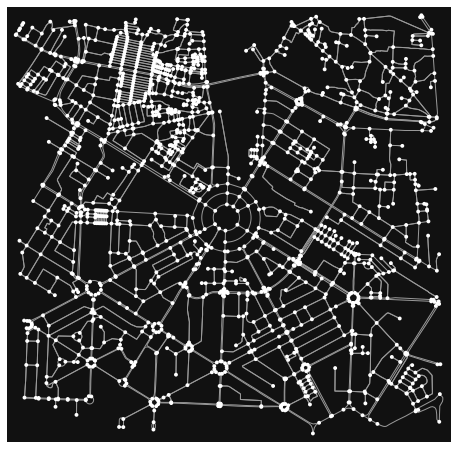

Connaught Place with Network Type : " drive " , have Nodes = 1595 and Edges = 3764 .
Wall time: 1.8 s


In [4]:
%%time
fig, ax=ox.plot_graph(ox.project_graph(G))
print(place,'with Network Type :', '"',network_type,'"', ', have Nodes =',len(G.nodes),'and Edges =', len(G.edges),'.')

In [5]:
# save graph file to local disk as geopckage and shape file

ox.save_graph_geopackage(G, filepath = f"{filepath}/{place}.gpkg")
ox.save_graph_shapefile(G, filepath = f"{filepath}/{place}.shp")

C:\JupyterLab\resources\jlab_server\lib\site-packages\osmnx\io.py:108: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_nodes.to_file(filepath_nodes, driver="ESRI Shapefile", index=True, encoding=encoding)


In [6]:
# Instead of downloading Map data every time, we can import data from local file fast as geodataframe
# G_local_nodes = gpd.read_file('C:/Users/HP/Desktop/OSMnX Work/Delhi Analysis/delhi.shp/nodes.shp')
# G_local_edges = gpd.read_file('C:/Users/HP/Desktop/OSMnX Work/Delhi Analysis/delhi.shp/edges.shp')

In [7]:
type(G)

networkx.classes.multidigraph.MultiDiGraph

In [8]:
# impute speed on all edges missing data
G = ox.add_edge_speeds(G)

# calculate travel time (seconds) for all edges
G = ox.add_edge_travel_times(G)

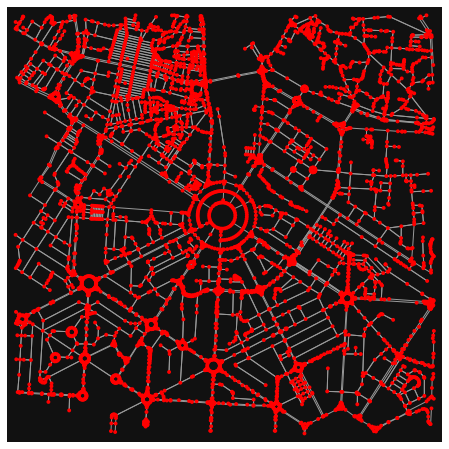

Connaught Place (unsimplified, Drive) Network has, Nodes = 5083 and Edges = 8590


In [9]:
# create an unsimplified graph
Gn = ox.graph_from_point(location, dist = 2000, network_type = network_type, simplify = False)
fig, ax=ox.plot_graph(Gn, node_color = 'r')
print(place, '(unsimplified, Drive) Network','has, Nodes =',len(Gn.nodes),'and Edges =', len(Gn.edges))

In [10]:
# convert your MultiDiGraph to an undirected MultiGraph
M = ox.get_undirected(G)

# convert your MultiDiGraph to a DiGraph without parallel edges
D = ox.get_digraph(G)

In [11]:
type(D)

networkx.classes.digraph.DiGraph

In [12]:
ox.stats.circuity_avg(M)

1.0343325876764573

In [13]:
# Now the next section shows how we can save nodes and edges saparately so that they can be accessed anytime

In [14]:
# saving graph as nodes and edges
nodes, edges = ox.graph_to_gdfs(G)
nodes.head()

,y,x,street_count,highway,geometry
osmid,,,,,
249782331,28.631635,77.221709,4,NaN,POINT (77.22171 28.63163)
249782337,28.630693,77.219532,3,NaN,POINT (77.21953 28.63069)
249782343,28.631842,77.217564,3,NaN,POINT (77.21756 28.63184)
249782349,28.633940,77.217678,4,NaN,POINT (77.21768 28.63394)
249783257,28.634113,77.222603,3,NaN,POINT (77.22260 28.63411)


In [15]:
list(nodes)

['y', 'x', 'street_count', 'highway', 'geometry']

In [16]:
edges.columns

Index(['osmid', 'oneway', 'name', 'highway', 'length', 'speed_kph',
       'travel_time', 'geometry', 'lanes', 'junction', 'access', 'maxspeed',
       'bridge'],
      dtype='object')

In [17]:
list(edges)[4]

'length'

In [18]:
edges.columns[4]

'length'

In [19]:
type(nodes)

geopandas.geodataframe.GeoDataFrame

In [20]:
# Convert geodataframes (gdfs) to MultidiGraphs (Create graph from nodes and edges)
G2 = ox.graph_from_gdfs(nodes, edges, graph_attrs= G.graph)

In [21]:
# areaa of graph in square meters?
G_proj = ox.project_graph(G)
nodes_proj = ox.graph_to_gdfs(G_proj, edges=False)
graph_area_m = nodes_proj.unary_union.convex_hull.area
graph_area_m

15536011.004026571

In [22]:
# show some basic stats about the network
stats = ox.basic_stats(G_proj, area=graph_area_m, clean_int_tol=15)
stats

{'n': 1595,
 'm': 3764,
 'k_avg': 4.71974921630094,
 'edge_length_total': 361772.401999998,
 'edge_length_avg': 96.11381562167854,
 'streets_per_node_avg': 2.946708463949843,
 'streets_per_node_counts': {0: 0, 1: 178, 2: 3, 3: 1149, 4: 256, 5: 9},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.1115987460815047,
  2: 0.0018808777429467085,
  3: 0.7203761755485893,
  4: 0.16050156739811913,
  5: 0.005642633228840125},
 'intersection_count': 1417,
 'street_length_total': 226365.8959999998,
 'street_segment_count': 2305,
 'street_length_avg': 98.20646247288495,
 'circuity_avg': 1.0347360952808136,
 'self_loop_proportion': 0.0,
 'clean_intersection_count': 855,
 'node_density_km': 102.66470586218131,
 'intersection_density_km': 91.20745342113537,
 'edge_density_km': 23286.0546961659,
 'street_density_km': 14570.400081548027,
 'clean_intersection_density_km': 55.033431669068975}

In [23]:
stats['streets_per_node_counts']

{0: 0, 1: 178, 2: 3, 3: 1149, 4: 256, 5: 9}

In [24]:
# Find Nodes for o & d from QGIS

o = 4526814298         #list(G)[899]
d = 3742396957         #list(G)[786]
# Shortest route by length
od1 = ox.shortest_path(G,o, d, weight = 'length')

# Shortest route by travel_time
od2 = ox.shortest_path(G,o, d, weight = 'travel_time')

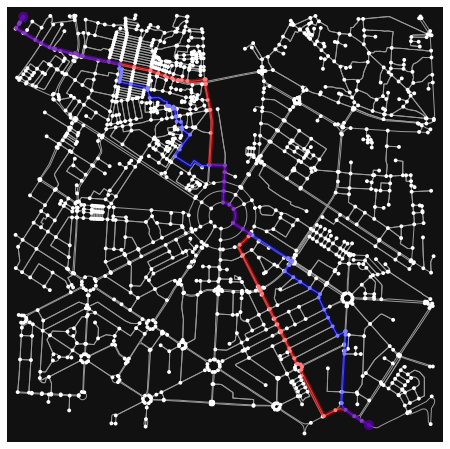

Shortest route by Distance has, Length = 6305 meter, Travel Time = 729 seconds and
Shortest route by Travel time has, Length = 6586 meter, Travel Time = 677 seconds.


In [25]:
# Plotting both routes in single graph
ax = ox.plot_graph_routes(G, routes = [od1, od2], route_colors = ["red", "blue"])
# length and Travel Time of route
print('Shortest route by Distance has, Length =',int(sum(ox.utils_graph.get_route_edge_attributes(G,od1,'length'))),'meter,',
      'Travel Time =',int(sum(ox.utils_graph.get_route_edge_attributes(G,od1,'travel_time'))),'seconds', 'and')
print('Shortest route by Travel time has, Length =',int(sum(ox.utils_graph.get_route_edge_attributes(G,od2,'length'))),'meter,',
      'Travel Time =',int(sum(ox.utils_graph.get_route_edge_attributes(G,od2,'travel_time'))),'seconds.')

In [26]:
# route information (proper) (km, hour)
print('Shortest route by travel distance has, Length =',(int(sum(ox.utils_graph.get_route_edge_attributes(G,od1,'length'))))/1000,'km,',
      'Travel Time =',round((int(sum(ox.utils_graph.get_route_edge_attributes(G,od1,'travel_time'))))/60,3),'min.', 'and'
      '\n''Shortest route by Travel-time has, Length =',(int(sum(ox.utils_graph.get_route_edge_attributes(G,od2,'length'))))/1000,'km,',
      'Travel Time =',round((int(sum(ox.utils_graph.get_route_edge_attributes(G,od2,'travel_time'))))/60, 3),'min.')

Shortest route by travel distance has, Length = 6.305 km, Travel Time = 12.15 min. and
Shortest route by Travel-time has, Length = 6.586 km, Travel Time = 11.283 min.


In [27]:
# Get the nodes along the shortest path
route_nodes = nodes_proj.loc[od1]
route_nodes

,y,x,street_count,lon,lat,highway,geometry
osmid,,,,,,,
4526814298,3.171178e+06,715047.157150,3,77.200209,28.649890,NaN,POINT (715047.157 3171177.715)
4463691618,3.171160e+06,715036.657668,3,77.200099,28.649732,NaN,POINT (715036.658 3171159.971)
4462504786,3.171126e+06,715016.301978,3,77.199884,28.649425,NaN,POINT (715016.302 3171125.660)
4462521875,3.171110e+06,715006.926237,3,77.199785,28.649282,NaN,POINT (715006.926 3171109.555)
943640799,3.171070e+06,714980.775460,4,77.199510,28.648926,NaN,POINT (714980.775 3171069.683)
...,...,...,...,...,...,...,...
3217361693,3.167484e+06,718106.074125,3,77.230782,28.616063,NaN,POINT (718106.074 3167484.116)
267075193,3.167490e+06,718202.787053,3,77.231771,28.616096,NaN,POINT (718202.787 3167489.568)
939091207,3.167431e+06,718287.711614,3,77.232628,28.615550,NaN,POINT (718287.712 3167430.552)


In [28]:
# saving panda dataframe to csv format in local
route_nodes.to_csv(f"{filepath}/{place}_shrt_rt_{o}-{d}.csv")

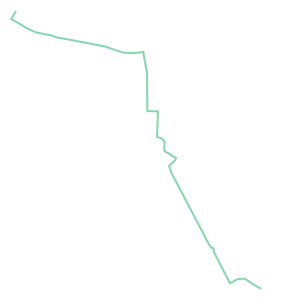

In [29]:
from shapely.geometry import LineString, Point

# Create a geometry for the shortest path
route_line = LineString(list(route_nodes.geometry.values))
route_line

In [30]:
## solving multiple shortest paths at once 

# calculate 100 shortest-path routes using random origin-destination pairs
n = 100
origs = np.random.choice(G.nodes, size=n, replace=True)
dests = np.random.choice(G.nodes, size=n, replace=True)

In [31]:
%%time
routes = ox.shortest_path(G, origs, dests, weight="travel_time", cpus=None)

Wall time: 8.47 s


In [32]:
print('osmid' in edges)

True


In [33]:




###############    ISOCHRONES     ###############





In [34]:
## ISOCHRONES WITH OSMNX

import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox
from descartes import PolygonPatch
from shapely.geometry import LineString
from shapely.geometry import Point
from shapely.geometry import Polygon

In [35]:
trip_times = [5,15,25]  # Trip time in minutes
travel_speed = 5 #KMPH

In [36]:
# Project the graph to UTM
gdf_nodes = ox.graph_to_gdfs(G, edges = False)
x, y = list(gdf_nodes.x)[688], list(gdf_nodes.y)[668]
center_node = list(G)[668]
x,y,center_node

(77.2199334, 28.6345795, 1869716945)

In [37]:
# add an edge attribute for time in minutes required to traverse each edge
meters_per_minute = 5 * 1000 / 60  # km per hour to m per minute ( take travel speed = 5 kmph)
for _, _, _, data in G.edges(data=True, keys=True):
    data["time"] = data["length"] / meters_per_minute

In [38]:
iso_colors = ox.plot.get_colors(n = len(trip_times), cmap = 'plasma', start = 0, return_hex = True)

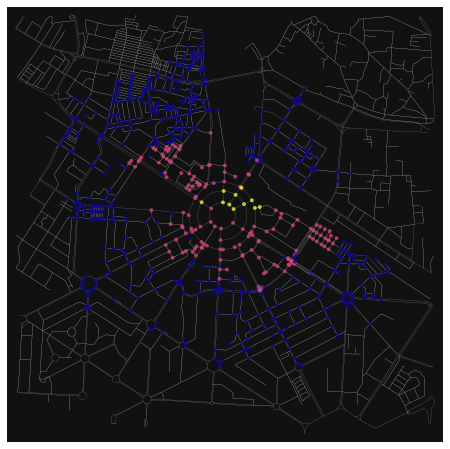

In [39]:
# color the nodes according to isochrone then plot the street network
node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else "none" for node in G.nodes()]
ns = [15 if node in node_colors else 0 for node in G.nodes()]
fig,ax=ox.plot_graph(G,node_color=nc,node_size=ns,node_alpha=0.8,edge_linewidth=0.2,edge_color="#999999")

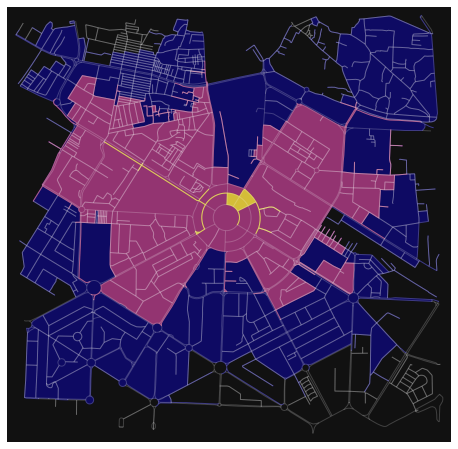

In [40]:
##  plot isochrones as buffers to get more faithful isochrones than convex hulls can offer

def make_iso_polys(G_proj, edge_buff=25, node_buff=50, infill=False):
    isochrone_polys = []
    for trip_time in sorted(trip_times, reverse=True):
        subgraph = nx.ego_graph(G_proj, center_node, radius=trip_time, distance="time")

        node_points = [Point((data["x"], data["y"])) for node, data in subgraph.nodes(data=True)]
        nodes_gdf = gpd.GeoDataFrame({"id": list(subgraph.nodes)}, geometry=node_points)
        nodes_gdf = nodes_gdf.set_index("id")

        edge_lines = []
        for n_fr, n_to in subgraph.edges():
            f = nodes_gdf.loc[n_fr].geometry
            t = nodes_gdf.loc[n_to].geometry
            edge_lookup = G_proj.get_edge_data(n_fr, n_to)[0].get("geometry", LineString([f, t]))
            edge_lines.append(edge_lookup)

        n = nodes_gdf.buffer(node_buff).geometry
        e = gpd.GeoSeries(edge_lines).buffer(edge_buff).geometry
        all_gs = list(n) + list(e)
        new_iso = gpd.GeoSeries(all_gs).unary_union

        # try to fill in surrounded areas so shapes will appear solid and
        # blocks without white space inside them
        if infill:
            new_iso = Polygon(new_iso.exterior)
        isochrone_polys.append(new_iso)
    return isochrone_polys


isochrone_polys = make_iso_polys(G_proj, edge_buff=5, node_buff=0, infill=True)
fig, ax = ox.plot_graph(G_proj, show=False, close=False, edge_color="w", edge_alpha=0.2, node_size=0)
for polygon, fc in zip(isochrone_polys, iso_colors):
    patch = PolygonPatch(polygon, fc=fc, ec="none", alpha=0.7, zorder=-1)
    ax.add_patch(patch)
plt.show()

In [41]:


###############    Network components from Edges     ###############



In [42]:
# different types of roads in network
highway = edges['highway'].value_counts()

#Converting geodataframe (geopanda) to panda
highway = pd.DataFrame(highway)
# saving panda dataframe to csv format in local
highway.to_csv(f"{filepath}/Edge_Attributes/{place}_highway.csv")

highway

,highway
residential,1864
secondary,662
tertiary,559
living_street,352
unclassified,238
secondary_link,58
tertiary_link,18
"[residential, tertiary]",2
"[unclassified, tertiary]",2
"[unclassified, living_street]",2


In [43]:
edges.columns

Index(['osmid', 'oneway', 'name', 'highway', 'length', 'speed_kph',
       'travel_time', 'geometry', 'lanes', 'junction', 'access', 'maxspeed',
       'bridge'],
      dtype='object')

In [44]:
oneway = edges['oneway'].value_counts()

#Converting geodataframe (geopanda) to panda
oneway = pd.DataFrame(oneway)
# saving panda dataframe to csv format in local
oneway.to_csv(f"{filepath}/Edge_Attributes/{place}_oneway.csv")

oneway

,oneway
False,2918
True,846


In [45]:
speed_kph = edges['speed_kph'].value_counts()

#Converting geodataframe (geopanda) to panda
speed_kph = pd.DataFrame(speed_kph)
# saving panda dataframe to csv format in local
speed_kph.to_csv(f"{filepath}/Edge_Attributes/{place}_speed_kph.csv")

speed_kph

,speed_kph
40.0,1870
35.0,1231
30.0,663


In [46]:
lanes = edges['lanes'].value_counts()

#Converting geodataframe (geopanda) to panda
lanes = pd.DataFrame(lanes)
# saving panda dataframe to csv format in local
lanes.to_csv(f"{filepath}/Edge_Attributes/{place}_lanes.csv")

lanes

,lanes
2,47
4,39
3,6
6,4


In [47]:
junction = edges['junction'].value_counts()

#Converting geodataframe (geopanda) to panda
junction = pd.DataFrame(junction)
# saving panda dataframe to csv format in local
junction.to_csv(f"{filepath}/Edge_Attributes/{place}_junction.csv")

junction

,junction
roundabout,201


In [48]:
access = edges['access'].value_counts()

#Converting geodataframe (geopanda) to panda
access = pd.DataFrame(access)
# saving panda dataframe to csv format in local
access.to_csv(f"{filepath}/Edge_Attributes/{place}_access.csv")

access

,access
no,12


In [49]:
maxspeed = edges['maxspeed'].value_counts()


#Converting geodataframe (geopanda) to panda
maxspeed = pd.DataFrame(maxspeed)
# saving panda dataframe to csv format in local
maxspeed.to_csv(f"{filepath}/Edge_Attributes/{place}_maxspeed.csv")

maxspeed

,maxspeed
40,2
30,1


In [50]:
bridge = edges['bridge'].value_counts()


#Converting geodataframe (geopanda) to panda
bridge = pd.DataFrame(bridge)
# saving panda dataframe to csv format in local
bridge.to_csv(f"{filepath}/Edge_Attributes/{place}_bridge.csv")


bridge

,bridge
yes,4


In [51]:



###############    Network Features     ###############

In [52]:
# get a GeoSeries of consolidated intersections
G_proj = ox.project_graph(G)
intersections = ox.consolidate_intersections(G_proj, rebuild_graph=False, tolerance=15, dead_ends=False)
len(intersections)

855

In [53]:
# compare to number of nodes in original graph
len(G)

1595

C:\Users\HP\AppData\Local\Temp/ipykernel_11164/3077075522.py:3: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  G2 = ox.consolidate_intersections(G_proj, rebuild_graph=True, tolerance=15, dead_ends=False)


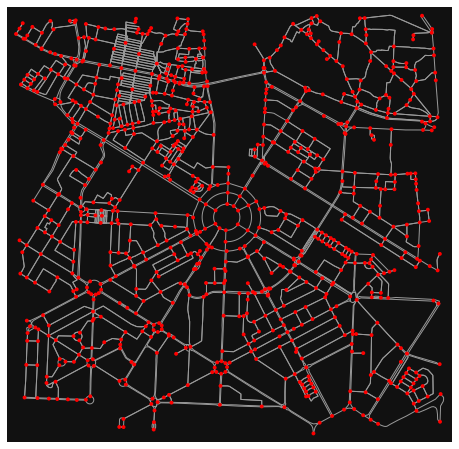

In [54]:
# consolidate intersections and rebuild graph topology
# this reconnects edge geometries to the new consolidated nodes
G2 = ox.consolidate_intersections(G_proj, rebuild_graph=True, tolerance=15, dead_ends=False)
len(G2)
fig, ax = ox.plot_graph(G2, node_color="r")

In [55]:
type(edges)

geopandas.geodataframe.GeoDataFrame

In [56]:
#  help(folium.Icon)

In [57]:
########################               WebMap                  #######################################


webmap = ox.folium.plot_graph_folium(G, graph_map=None, popup_attribute='osmid', tiles='openstreetmap', zoom=10,
                                     fit_bounds=True, control_scale=True)               # tiles='Stamen Toner'

# Add marker
folium.Marker(location = location, popup=place, icon=folium.Icon(color='red',icon='info-sign'),).add_to(webmap)

In [58]:
# save webmap as html file
webmap.save(f"{filepath}/webmap.html")

In [59]:
## PLOT A ROUTE ON TOP OF COMPLETE MAP

# plot the route with folium on top of the previously created graph_map
m3 = ox.plot_route_folium(G, od1, route_map=webmap,route_color = 'red', popup_attribute="name",weight=7, )
# save as html file
m3.save(f"{filepath}/route_graph.html")

C:\JupyterLab\resources\jlab_server\lib\site-packages\osmnx\folium.py:126: UserWarning: `route_color` has been deprecated and will be removed: use kwargs instead
  warn("`route_color` has been deprecated and will be removed: use kwargs instead")


In [60]:
m3

In [61]:
# save as html file
fp = f"{filepath}/{place}.html"
webmap.save(fp)


#######################################                       WebMap                      ###################################################

In [62]:


###############    Mean Speeds of road     ###############



In [63]:
# see mean speed/time values by road type
edges1 = ox.graph_to_gdfs(G, nodes=False)

In [64]:
edges1["highway"] = edges1["highway"].astype(str)
table = edges1.groupby("highway")[["length", "speed_kph", "travel_time"]].mean().round(1)

In [65]:
table

,length,speed_kph,travel_time
highway,,,
"['residential', 'living_street']",71.9,40.0,6.5
"['residential', 'tertiary']",219.4,40.0,19.7
"['residential', 'unclassified']",546.1,40.0,49.1
"['secondary', 'tertiary']",108.2,30.0,13.0
"['unclassified', 'living_street']",117.2,35.0,12.1
"['unclassified', 'tertiary']",64.8,35.0,6.7
living_street,66.3,35.0,6.8
residential,100.9,40.0,9.1
road,107.8,35.0,11.1


In [66]:
import pandas as pd

In [67]:
#converting to panda dataframe
tables = pd.DataFrame(table)

In [68]:
# saving panda dataframe to CSV file
tables.to_csv(f"{filepath}/speed_table.csv")

In [69]:
#Converting geodataframe (geopanda) to panda
pd_nodes = pd.DataFrame(nodes)
pd_edges = pd.DataFrame(edges)
# saving panda dataframe to csv format in local
pd_nodes.to_csv(f"{filepath}/{place}_nodes.csv")
pd_edges.to_csv(f"{filepath}/{place}_edges.csv")

In [70]:


###############    Circuity     ###############



In [71]:
import osmnx as ox

In [72]:
# circuity for walkable network vs drivable network
Gw = ox.graph_from_point(location, dist = dist, network_type = 'walk')
Mw = ox.utils_graph.get_undirected(Gw)
Gd = ox.graph_from_point(location, dist = dist, network_type = 'drive')
Md = ox.utils_graph.get_undirected(Gd)
print('Walk, Circuity =',ox.stats.circuity_avg(Mw).round(5))
print('Drive, Circuity =',ox.stats.circuity_avg(Md).round(5))

Walk, Circuity = 1.05862
Drive, Circuity = 1.03433


In [73]:


############## Circuity ##############

In [74]:
#################     Centrality     #################

##    1. Betweenness Centrality



In [75]:
import osmnx as ox
import networkx as nx

In [76]:
# calculate betweenness centrality with a digraph (no parallel edges)
centrality = nx.betweenness_centrality(D, weight = 'length')
max_node, max_bc = max(centrality.items(), key=lambda x: x[1])
max_node, max_bc

(249783308, 0.15527941015468397)

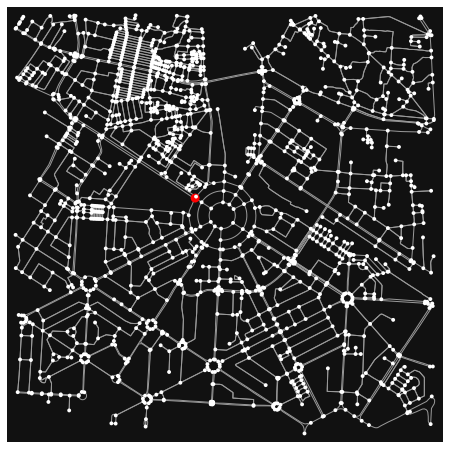

Node 249783308 has highest 'betweenness Centrality', and
15.53 % of shortest path pass through this node.


In [77]:
# find out node and plot on graph
node_color = ['red' if node == max_node else 'white' for node in G.nodes]
node_size = [80 if node == max_node else 15 for node in G.nodes]
ax = ox.plot_graph(G, node_color = node_color, node_size = node_size)
print('Node', max_node, "has highest 'betweenness Centrality', and")
print(round(max_bc*100,2), '% of shortest path pass through this node.')

In [78]:


##    2. Closeness Centrality



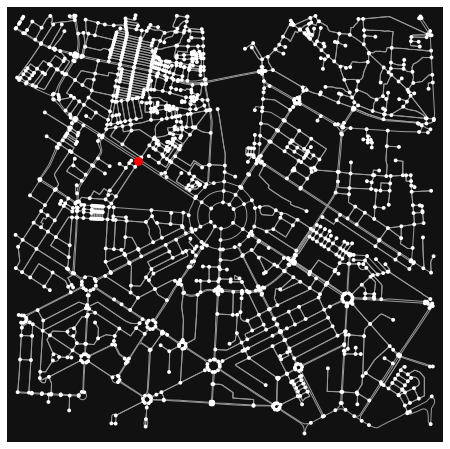

Node 1869716959 has lowest 'closeness Centrality' of 5.42 %.


In [79]:
# calculate betweenness with a digraph (no parallel edges)
centrality = nx.closeness_centrality(D)
max_node, max_bc = max(centrality.items(), key=lambda x: x[1])
max_node, max_bc

# find out node and plot on graph
node_color = ['red' if node == max_node else 'white' for node in G.nodes]
node_size = [80 if node == max_node else 15 for node in G.nodes]
ax = ox.plot_graph(G, node_color = node_color, node_size = node_size)
print('Node', max_node, "has lowest 'closeness Centrality' of",round(max_bc*100,2),'%.' )

In [80]:


##    3. information Centrality



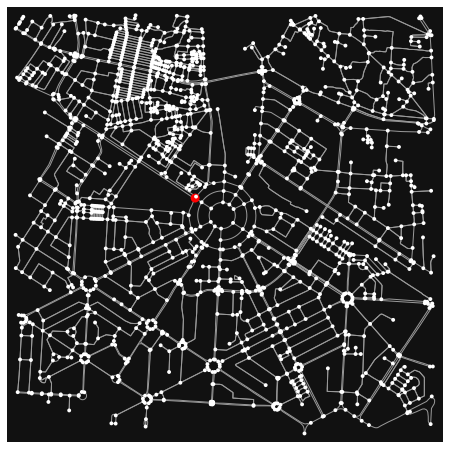

Node 249783308 has maximum 'information Centrality' of 0.0222 %.


In [81]:
# calculate betweenness with a digraph (no parallel edges) M = undirected Graph
centrality = nx.information_centrality(M)
max_node, max_bc = max(centrality.items(), key=lambda x: x[1])
max_node, max_bc

# find out node and plot on graph
node_color = ['red' if node == max_node else 'white' for node in G.nodes]
node_size = [80 if node == max_node else 15 for node in G.nodes]
ax = ox.plot_graph(G, node_color = node_color, node_size = node_size)
print('Node', max_node, "has maximum 'information Centrality' of",round(max_bc*100,4),'%.' )

In [82]:


##    4. Straightness Centrality (inverse of average circuity )



In [83]:
circuity = ox.stats.circuity_avg(M).round(5)
print('Straightness Centrality for given network is',(100/circuity).round(2),'%.')


Straightness Centrality for given network is 96.68 %.


In [84]:



#################     Centrality     #################

In [85]:
print(centrality)

{249782331: 0.0002122655021300342, 249782337: 0.00020410764589623697, 249782343: 0.0002047990802830876, 249782349: 0.00021804207771759123, 249783257: 0.00020084816430036422, 249783291: 0.00018870196028298287, 249783293: 0.00020769835760089104, 249783302: 0.00020677952133798855, 249783308: 0.00022216990414684217, 249783313: 0.0002061852599029041, 249783316: 0.00021464966390525214, 249786848: 0.0001825951400918037, 249786894: 0.00016483124621672718, 249786895: 0.00016207287790281647, 249786899: 0.00017712898862657587, 249786900: 0.00017186396876692436, 249786902: 0.00015525446203498198, 249791934: 0.00015732780439010446, 267075193: 0.0001478853133005879, 267075194: 0.0001480437970676069, 267075233: 0.00016038342670312598, 267196295: 0.00016074157927238697, 267196297: 0.0001533572104792754, 267196303: 0.00014258996346284982, 267196304: 0.00015783948508506565, 267196305: 0.00016524612550712541, 267196308: 0.00015571147459464448, 267196309: 0.00015870198866141394, 267196314: 0.0001589162874

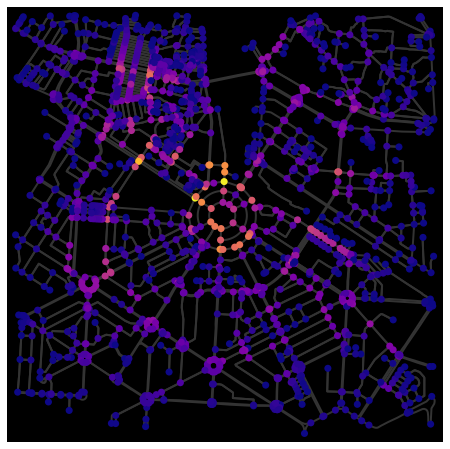

In [86]:
# calculate node betweenness centrality, weighted by travel time
bc = nx.betweenness_centrality(D, weight="travel_time", normalized=True)
nx.set_node_attributes(G, values=bc, name="bc")

# plot the graph, coloring nodes by betweenness centrality
nc = ox.plot.get_node_colors_by_attr(G, "bc", cmap="plasma")
fig, ax = ox.plot_graph(G, bgcolor="black", node_color=nc, node_size=50, edge_linewidth=2, edge_color="#333333")

In [87]:
############     Degree of each node    #############
G.degree()

DiMultiDegreeView({249782331: 4, 249782337: 3, 249782343: 3, 249782349: 4, 249783257: 3, 249783291: 3, 249783293: 4, 249783302: 4, 249783308: 4, 249783313: 3, 249783316: 5, 249786848: 3, 249786894: 3, 249786895: 3, 249786899: 3, 249786900: 3, 249786902: 3, 249791934: 3, 267075193: 3, 267075194: 4, 267075233: 3, 267196295: 3, 267196297: 3, 267196303: 4, 267196304: 3, 267196305: 6, 267196308: 4, 267196309: 4, 267196314: 4, 267196319: 4, 267196320: 6, 267196336: 8, 267196337: 8, 267196340: 2, 267197815: 3, 267197828: 3, 267197829: 6, 267197830: 4, 267197831: 6, 267197832: 6, 267198388: 3, 267198390: 4, 267198392: 4, 267198394: 3, 267247452: 6, 267247454: 6, 267247456: 6, 267247460: 4, 267247462: 6, 267247464: 6, 267247468: 6, 267249900: 3, 267249902: 3, 267249903: 3, 267249905: 3, 267249911: 3, 267249912: 3, 267249914: 3, 267249915: 3, 267249920: 3, 267249923: 3, 267249926: 3, 267249927: 3, 267249930: 3, 267249941: 4, 267249943: 3, 267249944: 3, 267249954: 4, 267249955: 3, 267249959: 3, 2

In [88]:
degree = list(G.degree())

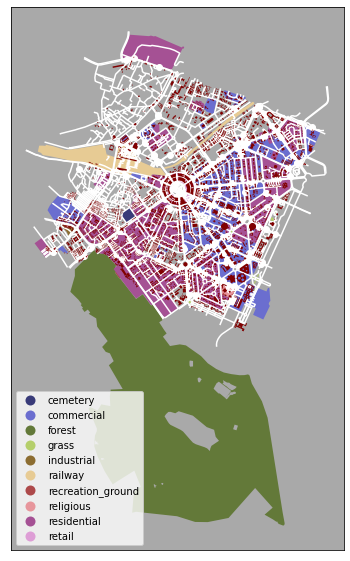

In [89]:

###############    Network Features     ###############



# New geometries module
geo = ox.geometries_from_point(location, dist=dist, tags={'highway':True, 'landuse':True, 'building':True})

# Presentation code
geo.to_crs(epsg=27700, inplace=True)

fig,ax = plt.subplots(figsize=(10,10))
geo[geo['landuse'].notna()].plot(ax=ax, column='landuse', cmap='tab20b', legend=True)
geo[geo['highway'].notna()].plot(ax=ax, color='white')
geo[geo['building'].notna()].plot(ax=ax, color='maroon', zorder=3)
ax.set_facecolor('darkgrey')
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)

In [90]:
import geopandas as gpd
import matplotlib.pyplot as plt
import mplleaflet
from folium.plugins import HeatMap

In [91]:
# File path
points_fp = f"{filepath}/{place}.shp/nodes.shp"

# Read the data
points = gpd.read_file(points_fp)

#Check input data
points.head()

,osmid,y,x,street_cou,highway,geometry
0,249782331,28.631635,77.221709,4,None,POINT (77.22171 28.63163)
1,249782337,28.630693,77.219532,3,None,POINT (77.21953 28.63069)
2,249782343,28.631842,77.217564,3,None,POINT (77.21756 28.63184)
3,249782349,28.633940,77.217678,4,None,POINT (77.21768 28.63394)
4,249783257,28.634113,77.222603,3,None,POINT (77.22260 28.63411)


In [92]:

# Get x and y coordinates for each point
points["x"] = points["geometry"].apply(lambda geom: geom.x)
points["y"] = points["geometry"].apply(lambda geom: geom.y)

# Create a list of coordinate pairs
locations = list(zip(points["y"], points["x"]))

In [94]:
heatmap = ox.folium.plot_graph_folium(G, tiles='Stamen Toner', zoom=10, control_scale=True)                          # tiles='Stamen Toner'

# Add marker
folium.Marker(location = location, popup=place, icon=folium.Icon(color='red',icon='info-sign'),).add_to(heatmap)

from folium.plugins import HeatMap
HeatMap(locations).add_to(heatmap)
# Add heatmap to map instance
# Available parameters: HeatMap(data, name=None, min_opacity=0.5, max_zoom=18, max_val=1.0, radius=25,
#                               blur=15, gradient=None, overlay=True, control=True, show=True)


In [95]:
heatmap

In [96]:
# save webmap as html file
heatmap.save(f"{filepath}/heatmap.html")

In [97]:
#general libraries

from shapely.geometry import shape
from shapely.geometry import LineString
import polyline
from osgeo import ogr, osr
import geopandas as gpd
import pandas as pd
import json
import time


#specific to osrm approach
import requests

#specific to osmnx & networkx approach
import networkx as nx
import osmnx as ox

#specific to googlemaps approach
import googlemaps

#import folium

In [98]:
#Read the csv with origin-destination pairs arranged row-wise. 
#In the table used in this example, o_long and o_lat are coordinates of origin point, similarly for destination

df = pd.read_csv("C:/Users/HP/Desktop/OSMnx Work/OD_pairs.csv")
df

,o_id,o_osmid,o_long,o_lat,d_id,d_osmid,d_long,d_lat
0,o1,4526814298,77.200209,28.649890,d1,267259450,77.201864,28.619369
1,o2,1802523184,77.210232,28.649103,d2,6720409811,77.212190,28.614654
2,o3,1802518258,77.217316,28.647357,d3,4231341737,77.227098,28.617261
3,o4,1802518266,77.216002,28.645574,d4,6738525667,77.237577,28.619788
4,o5,566394190,77.236214,28.645446,d5,6225721613,77.199473,28.628279


In [103]:
# 2. OSMnx and Networkx for shortest paths

In [104]:
def nodes_to_linestring(path):
    coords_list = [(G.nodes[i]['x'], G.nodes[i]['y']) for i in path ]
    #print(coords_list)
    line = LineString(coords_list)
    
    return(line)

def shortestpath(o_lat, o_long, d_lat, d_long):
    
    nearestnode_origin, dist_o_to_onode = ox.distance.get_nearest_node(G, (o_lat, o_long), method='haversine', return_dist=True)
    nearestnode_dest, dist_d_to_dnode = ox.distance.get_nearest_node(G, (d_lat, d_long), method='haversine', return_dist=True)
    
    #Add up distance to nodes from both o and d ends. This is the distance that's not covered by the network
    dist_to_network = dist_o_to_onode + dist_d_to_dnode
    
    shortest_p = nx.shortest_path(G,nearestnode_origin, nearestnode_dest) 
    
    route = nodes_to_linestring(shortest_p) #Method defined above
    
    # Calculating length of the route requires projection into UTM system. Using 
    inSpatialRef = osr.SpatialReference()
    inSpatialRef.ImportFromEPSG(4326)
    outSpatialRef = osr.SpatialReference()
    outSpatialRef.ImportFromEPSG(32643)
    coordTransform = osr.CoordinateTransformation(inSpatialRef, outSpatialRef)
    
    #route.wkt returns wkt of the shapely object. This step was necessary as transformation can be applied 
    #only on an ogr object. Used EPSG 32643 as Bangalore is in 43N UTM grid zone.
    geom = ogr.CreateGeometryFromWkt(route.wkt)
   
    geom.Transform(coordTransform)
    length = geom.Length()
    
    #Total length to be covered is length along network between the nodes plus the distance from the O,D points to their nearest nodes
    total_length = length + dist_to_network
    #in metres
    
    return(route, total_length )

In [105]:
start_time = time.time()

df['osmnx_geometry'] = df.apply(lambda x: shortestpath(x['o_lat'], x['o_long'], x['d_lat'], x['d_long'])[0] , axis=1)
df['osmnx_length'] = df.apply(lambda x: shortestpath(x['o_lat'], x['o_long'], x['d_lat'], x['d_long'])[1] , axis=1)

print("Time taken: ", (time.time() - start_time), "seconds")
df
#Note that the lambda function returns a tuple. While applying the function, have add [0] and [1] to return only one of the two outputs. 
#There must be a nicer way to add both outputs in one go. This was more of a fluke try which worked. 
# Alternatively, you could define two functions to return both separtely, but might be an overkill

C:\JupyterLab\resources\jlab_server\lib\site-packages\osmnx\distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
C:\JupyterLab\resources\jlab_server\lib\site-packages\osmnx\distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
C:\JupyterLab\resources\jlab_server\lib\site-packages\osmnx\distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
C:\JupyterLab\resources\jlab_server\lib\site-packages\osmnx\distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.n

Time taken:  0.30072665214538574 seconds


C:\JupyterLab\resources\jlab_server\lib\site-packages\osmnx\distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
C:\JupyterLab\resources\jlab_server\lib\site-packages\osmnx\distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
C:\JupyterLab\resources\jlab_server\lib\site-packages\osmnx\distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
C:\JupyterLab\resources\jlab_server\lib\site-packages\osmnx\distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.n

,o_id,o_osmid,o_long,o_lat,d_id,d_osmid,d_long,d_lat,routes,osmnx_geometry,osmnx_length
0,o1,4526814298,77.200209,28.649890,d1,267259450,77.201864,28.619369,{},"LINESTRING (77.2002095 28.6498898, 77.20009880...",3271.957316
1,o2,1802523184,77.210232,28.649103,d2,6720409811,77.212190,28.614654,{},"LINESTRING (77.2102321 28.6491027, 77.20906549...",3839.781037
2,o3,1802518258,77.217316,28.647357,d3,4231341737,77.227098,28.617261,{},"LINESTRING (77.21731560000001 28.6473565, 77.2...",2288.214504
3,o4,1802518266,77.216002,28.645574,d4,6738525667,77.237577,28.619788,{},"LINESTRING (77.21600170000001 28.645574, 77.21...",3219.239947
4,o5,566394190,77.236214,28.645446,d5,6225721613,77.199473,28.628279,{},"LINESTRING (77.23621439999999 28.6454463, 77.2...",4701.921515


In [107]:
# rename osmnx_geometry column to 'geometry' to pass it as the geometry component to the new geo dataframe
df = df.rename(columns = {'osmnx_geometry':'geometry'})
gpdf = gpd.GeoDataFrame(df, geometry = df['geometry'])
gpdf.to_file(f"{filepath}/osmnx_shortestpaths/osmnx_shortestpaths.shp")

C:\Users\HP\AppData\Local\Temp/ipykernel_11164/1782978242.py:4: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gpdf.to_file(f"{filepath}/osmnx_shortestpaths/osmnx_shortestpaths.shp")


In [108]:
gpdf

,o_id,o_osmid,o_long,o_lat,d_id,d_osmid,d_long,d_lat,routes,geometry,osmnx_length
0,o1,4526814298,77.200209,28.649890,d1,267259450,77.201864,28.619369,{},"LINESTRING (77.20021 28.64989, 77.20010 28.649...",3271.957316
1,o2,1802523184,77.210232,28.649103,d2,6720409811,77.212190,28.614654,{},"LINESTRING (77.21023 28.64910, 77.20907 28.649...",3839.781037
2,o3,1802518258,77.217316,28.647357,d3,4231341737,77.227098,28.617261,{},"LINESTRING (77.21732 28.64736, 77.21746 28.646...",2288.214504
3,o4,1802518266,77.216002,28.645574,d4,6738525667,77.237577,28.619788,{},"LINESTRING (77.21600 28.64557, 77.21650 28.645...",3219.239947
4,o5,566394190,77.236214,28.645446,d5,6225721613,77.199473,28.628279,{},"LINESTRING (77.23621 28.64545, 77.23600 28.645...",4701.921515


In [109]:
type(gpdf)

geopandas.geodataframe.GeoDataFrame

In [110]:
line1 = gpdf.routes[0]

In [111]:
line = list(line1.items())
print(line)

[]


In [113]:




# Finding Dead ends and intersections saparately





streets_per_node = ox.stats.streets_per_node(G)
node_ids = set(G.nodes())
intersections = [node for node, count in streets_per_node.items() if count>1]
dead_ends = [node for node, count in streets_per_node.items() if count==1]

In [114]:
print(dead_ends)    # print(intersections)

[267196340, 267253207, 267253209, 267259416, 267259437, 450639204, 943560345, 943560801, 1191294827, 1349091941, 1349091956, 1349091958, 1349091959, 1349091961, 1349091974, 1349092000, 1349092003, 1349092023, 1349092029, 1349092038, 1349092054, 1349092075, 1349092078, 1376266492, 1523199483, 1563326767, 1588306357, 1763009598, 1763141110, 1763141121, 1802507603, 1802509343, 1802518241, 1802518266, 1802525706, 2946891545, 2946891550, 2967264865, 2971303939, 3177903044, 3177903047, 3257045701, 3504623688, 3648355169, 3743678683, 4231341733, 4231341783, 4231821233, 4231821256, 4231821257, 4231821280, 4234992494, 4234992495, 4234992496, 4235030397, 4333487323, 4398510560, 4589452412, 4589452413, 4589452414, 4589539952, 5233644925, 5247558847, 5434483919, 5572575410, 5572575413, 5799521449, 5799521553, 5799521559, 6191789599, 6436532342, 6436685290, 6437691106, 6438297462, 6487929468, 6531650300, 6541400730, 6541400733, 6541400736, 6541904366, 6541904368, 6542094516, 6543989747, 6543989781,

In [115]:
len(intersections)

1417

In [116]:
len(dead_ends)

178

In [117]:
stats['streets_per_node_counts']

{0: 0, 1: 178, 2: 3, 3: 1149, 4: 256, 5: 9}

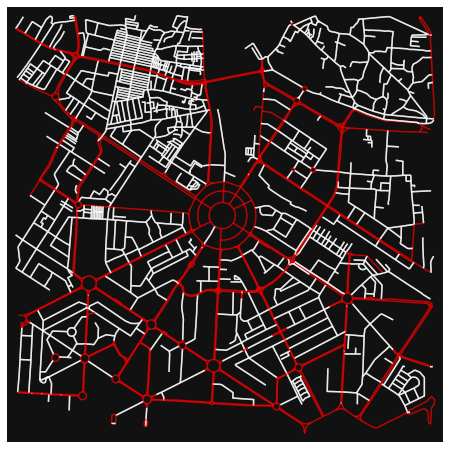

In [118]:
# Highlighting oneway streets

ec = ['r' if data['oneway'] else 'w' for u, v, key, data in G.edges(keys=True, data=True)]
fig, ax = ox.plot_graph(G, node_size=0, edge_color=ec, edge_linewidth=1.5, edge_alpha=0.7)

In [119]:
# add elevation to nodes automatically, calculate edge grades, plot network
# you need a google elevation api key to run this cell!
try:
    from keys import google_elevation_api_key

    G = ox.add_node_elevations(G, api_key=google_elevation_api_key)
    G = ox.add_edge_grades(G)
    nc = ox.plot.get_node_colors_by_attr(G, "elevation", cmap="plasma")
    fig, ax = ox.plot_graph(G, node_color=nc, node_size=20, edge_linewidth=2, edge_color="#333")
except ImportError:
    pass

In [120]:
# get all building footprints in some neighborhood
tags = {"building": True}
building = ox.geometries_from_point(location, tags, dist=dist)
building.shape

(3562, 84)

In [121]:
tags2={"leisure": "park"}
gdf2=ox.geometries_from_point(location, tags2, dist=dist)
tags3 = {"highway": "bus_stop"}
gdf3=ox.geometries_from_point(location, tags3, dist=dist)
tags4={"landuse":["retail"]}
gdf4 = ox.geometries_from_point(location, tags4, dist=dist)
tags5={"landuse":["commercial"]}
gdf5 = ox.geometries_from_point(location, tags5, dist=dist)
tags6={"highway":True}
gdf6 = ox.geometries_from_point(location, tags6, dist=dist)

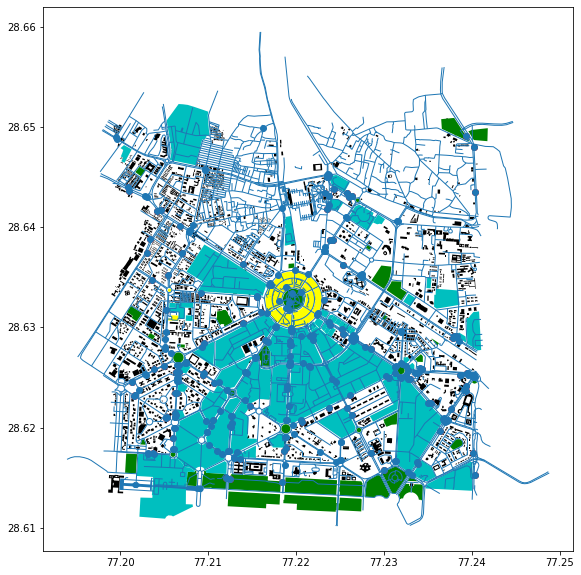

In [122]:
bldg = building.plot(figsize=(10,10), color='black')
park = gdf2.plot(ax = bldg,color='green')
bustop = gdf3.plot(ax=park,color='red')
landuse = gdf4.plot(ax=bustop,color='yellow')
landuse2 = gdf5.plot(ax=landuse,color='c')
highway = gdf6.plot(ax=landuse2,linewidth=1)

In [123]:
# save figure to local disk
fig=highway.get_figure()
fig.savefig(f"{filepath}/{place}_plot.jpg")

In [124]:
# add bearigs to all edges 
ox.bearing.add_edge_bearings(M, precision=1)
# Calculating network orientation
ox.bearing.orientation_entropy(M)

3.4349834788381317

(<Figure size 360x360 with 1 Axes>,
 <PolarAxesSubplot:title={'center':'Polar histogram\nConnaught Place'}>)

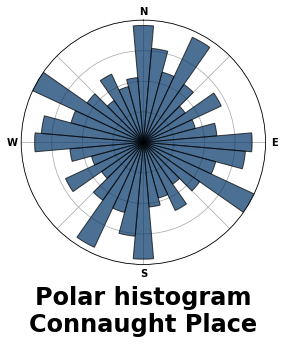

In [125]:
# Plot a polar histogram of a spatial network’s bidirectional edge bearings. 
ox.bearing.plot_orientation(M,num_bins=36, min_length=0, weight=None, ax=None, figsize=(5, 5), 
                            area=True, color='#003366',edgecolor='k', linewidth=1, alpha=0.7, 
                            title='Polar histogram\nConnaught Place',title_y=-0.3, title_font=None, xtick_font=None)

In [126]:
#################################






# TRY






#################################

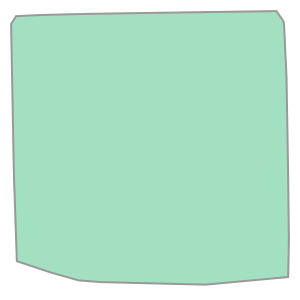

In [127]:
# Get the Convex Hull of the network
convex_hull = nodes_proj.unary_union.convex_hull
# Show output
convex_hull

In [128]:
convex_hull.area

15536011.004026571

In [129]:
print(convex_hull.centroid)

POINT (717028.9236571032 3169275.723213316)
